In [2]:
import numpy as np
from scipy.io import loadmat
from scipy.stats import chi2_contingency
from scipy.spatial import KDTree
import os
from collections import Counter
import pandas as pd
import time
from matplotlib import pyplot as plt
import shutil
from sklearn.cluster import KMeans

download_data_readpath = 'E:/Dataset/wind_shear/Data_Download'
exception_data_readpath = '../Dataset/Exception_Data'
result_savepath = '../result'

# 读取download_path目录下的所有文件夹
download_folder_names = [item for item in os.listdir(download_data_readpath) if os.path.isdir(os.path.join(download_data_readpath,item))]

# 读取exception_data_path目录下的所有文件夹
file_names = os.listdir(exception_data_readpath)
folder_names = [item for item in file_names if os.path.isdir(os.path.join(exception_data_readpath, item))]

# 参数设置
K = 16 # K-means++ param
internal_segment_quantiles = [0.25, 0.5, 0.75]

In [12]:
# 检测所有mat的变量列表似然度
variable_list_excel_savepath = os.path.join(result_savepath, 'variable_list')
if os.path.exists(variable_list_excel_savepath) == False:
    os.mkdir(variable_list_excel_savepath)

variable_lists2D = []
variable_list_counter = Counter()

# 对所有mat文件的变量列表进行类型计数
mat_num = 0
for folder_name in folder_names:
    data_folder = os.path.join(exception_data_readpath, folder_name)
    mat_names = os.listdir(data_folder)
    variable_lists = []
    for mat_name in mat_names:
        mat_path = os.path.join(data_folder, mat_name)
        mat_data = loadmat(mat_path)
        # print(list(mat_data.keys()))
        variable_lists.append(list(mat_data.keys()))
        variable_list_counter.update([tuple(variable_lists[-1])])
        mat_num += 1
    variable_lists2D.append(variable_lists)
    # break
# variable_matrix = np.array(variable_lists2D)
print(f"Total mat document number: {mat_num}")

varList_type_id = 0
for variables, count in variable_list_counter.items():
    # print(f"{variables}: {count}")
    print("Variable number in current type is: %d"%len(list(variables)))

    # 由于每个文件夹中mat文件数目不一致，生成的三维数组并不是矩阵，会出现AttributeError: 'bool' object has no attribute 'all'
    '''match_ids = np.where((variable_matrix == list(variables)).all(axis=2))
    # print(len(match_ids[0]))
    first_match_id = [match_ids[0][0], match_ids[1][0]]
    print(first_match_id)'''
    
    # 找到第一个与类型变量列表相符的mat文件，并将其description输出
    first_match_id = []
    for row in variable_lists2D:
        match_ids = np.where((np.array(row) == list(variables)).all(axis=1))
        # print(len(match_ids))
        if match_ids[0].size != 0:
            first_match_id = [variable_lists2D.index(row), match_ids[0][0]]
            print("Adopt the first match id " + str(first_match_id) + " as variable description source")
            break

    data_folder = os.path.join(exception_data_readpath, folder_names[first_match_id[0]])
    mat_names = os.listdir(data_folder)
    mat_data = loadmat(os.path.join(data_folder, mat_names[first_match_id[1]]))
    variables_description = []
    for key, value in mat_data.items():
        # print(value)
        if key.startswith("__") and key.endswith("__"):
            variables_description.append('NA')
            continue
        variables_description.append(value["Description"][0][0][0])

    # 将当前变量列表类型导出为excel
    excel_matrix = np.array([list(variables), variables_description]).T
    excel_df = pd.DataFrame(excel_matrix, columns=['variable', 'description'])
    excel_df.to_excel(os.path.join(variable_list_excel_savepath, "type_%d.xlsx"%varList_type_id), index=False)

    varList_type_id += 1


Total mat document number: 3974
Variable number in current type is: 189
Adopt the first match id [0, 0] as variable description source


In [ ]:
# 变量类型筛选（静态/动态）并打印所有变量

folder_name = folder_names[0]
data_folder = os.path.join(exception_data_readpath, folder_name)
mat_names = os.listdir(data_folder)
mat_path = os.path.join(data_folder, mat_names[0])
variable_figure_savepath = os.path.join(variable_list_excel_savepath, "variable plots")
if os.path.exists(variable_figure_savepath) == False:
    os.mkdir(variable_figure_savepath)

static_variables = []
dynamic_variables = []
for variable, content in mat_data.items():
    if variable.startswith("__") and variable.endswith("__"):
        continue
    # print(content)
    variable_data = content['data'][0][0]
    sampling_rate = content['Rate'][0][0][0]
    # print(variable_data.shape)
    if np.var(variable_data) == 0:
        static_variables.append(variable)
    else:
        dynamic_variables.append(variable)
    plt.figure()
    plt.plot(variable_data)
    plt.xlabel(variable)
    plt.ylabel("value")
    plt.title(variable+"_rate"+str(sampling_rate))
    plt.savefig(os.path.join(variable_figure_savepath, variable + ".png"))
    # break

print(dynamic_variables)
print(len(dynamic_variables))

In [11]:
print(len(folder_names))

309


In [4]:
mat_sum = 0
WS_zero_mat_sum = 0
for folder_name in folder_names:
    data_folder = os.path.join(download_data_readpath, folder_name)
    mat_names = os.listdir(data_folder)
    for mat_name in mat_names:
        mat_path = os.path.join(data_folder, mat_name)
        mat_data = loadmat(mat_path)
        WS_dict = mat_data['WS']
        variable_data = WS_dict['data'][0][0]
        sampling_rate = WS_dict['Rate'][0][0][0]
        if np.var(variable_data) == 0:
            WS_zero_mat_sum += 1
        mat_sum += 1
print(WS_zero_mat_sum, mat_sum)
    

26527 180117


In [15]:
# 对原始数据集进行卡方检验
Chi_square_savepath = os.path.join(result_savepath, "Chi_square")
if os.path.exists(Chi_square_savepath) == False:
    os.mkdir(Chi_square_savepath)

folder_mat_total_num_list = []
folder_mat_exception_num_list = []
for folder_name in download_folder_names:
    download_folder = os.path.join(download_data_readpath, folder_name)
    folder_mat_total_num_list.append(len(os.listdir(download_folder)))
    data_folder = os.path.join(exception_data_readpath, folder_name)
    if os.path.exists(data_folder) == False:
        folder_mat_exception_num_list.append(0)
    else:
        folder_mat_exception_num_list.append(len(os.listdir(data_folder)))

# 执行卡方检验
Chi_square_test_array = np.vstack([folder_mat_exception_num_list, folder_mat_total_num_list])
print(Chi_square_test_array)
print(np.sum(Chi_square_test_array[1]))
np.save(os.path.join(Chi_square_savepath, 'downdoad_data_test_array'), Chi_square_test_array)
chi2, p, dof, expected = chi2_contingency(Chi_square_test_array)
print("卡方值：", chi2)
print("p值：", p)
print("自由度：", dof)
# print("期望值：", expected)


[[ 16   8   9  11  15  17  12   3  10  10   5   8  24  17  16   1  20  13
   13  10  17  16  15   3  15  11   2  20  20  17  17  12  17   7   8  12
   19  20  16   6  16   9   8  13  14  13   6  15  17  13  10  11  17  12
   12   7  13   5   8  15  18  11  14   8   8  10   4  27  19   5   4  14
    7  27  14   9  13  19   4  14   6  10   6  21  21  15  16  16   8  14
   11  18  14  13   3  14  10   9   7  13  19  17  21   1  11   8  19  32
   23  17  11   6   6   8   5  15   8   9  17  16  15  19  12   9  12  13
    8   5  10  14  31  16  13  16  10   9  18  18  17  11  20  25   6  16
    5   6  18   9  10  16   5  12  16  11  19  15  19  10  14  11  19   7
    3  10  10   9  14  12   7  16  11  10   8   7  11  18   5   8  12  14
   11  11  10  11   6  16  11  12   7  15  12   5   6  14  29  19  15  17
   25  15  11   2  10   8  12   7  14  16  11  13  10  13  11   9  10  12
   10   8  29  16  13  10  12  15  13  16  19   9   8  14  25  10  15  13
   18  15   1  15   9  12  13  13  16 

In [106]:
# 按照航程(DWPT)的长度对mat文件进行分类

# 读取全部DWPT信息
'''
理论上它们应当是一个从总里程递减至0的数据
但实际数据中基本不会发生变化
但由于采样率恒定为1
因此将DWPT数据的列表总长作为航程长度的代表数据
'''
dwpt_list_savepath = os.path.join(result_savepath, 'dwpt_list')
if os.path.exists(dwpt_list_savepath) == False:
    os.mkdir(dwpt_list_savepath)

import os
import numpy as np

dwpt_lists = [
    [
        len(loadmat(os.path.join(os.path.join(download_data_readpath, folder_name), mat_name))["DWPT"][0][0][0])
        for mat_name in os.listdir(os.path.join(download_data_readpath, folder_name))
    ]
    for folder_name in download_folder_names
]

np.save(os.path.join(dwpt_list_savepath, 'dwpt_alldata_lists.npy'), dwpt_lists)


In [107]:
print(len(dwpt_lists))

310


In [86]:
# print(len(np.array(y_axis_dwpt_lengths)[0:]))
print(len(y_axis_dwpt_lengths))
print(len(dwpt_lists[1]))

108634451
627


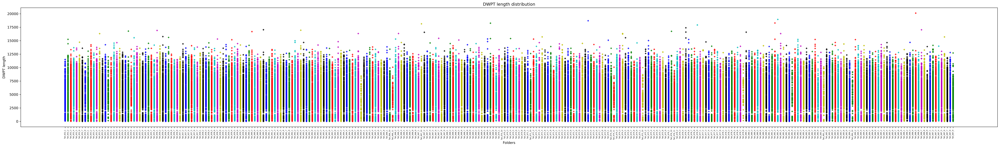

In [108]:
# DWPT 航程长度分布散点可视化
plt.figure(figsize=(40,6), dpi=300)
x_axis_folders = []
y_axis_dwpt_lengths = []
# selected_colors = np.arange(len(folder_names))
selected_colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
colors = []
for iList in range(len(dwpt_lists)):
    dwpt_list = dwpt_lists[iList]
    y_axis_dwpt_lengths.extend(dwpt_list)
    for i in range(len(dwpt_list)):
        x_axis_folders.append(download_folder_names[iList])
        colors.append(selected_colors[iList%len(selected_colors)])

plt.scatter(x_axis_folders, y_axis_dwpt_lengths, c=colors, marker='+', s=20, alpha=1)
plt.xticks(rotation='vertical')
plt.tick_params(axis='x', pad=5, labelsize=5)
plt.xlabel("Folders")
plt.ylabel("DWPT length")
plt.title("DWPT length distribution")
plt.tight_layout()
plt.savefig(os.path.join(dwpt_list_savepath, "DWPT_length_alldata__distribution.png"))
plt.show()

In [112]:
# 基于航程的近邻聚类
'''dwpt_lists = []
for folder_name in folder_names:
    data_folder = os.path.join(exception_data_readpath, folder_name)
    mat_names = os.listdir(data_folder)
    dwpt_list = []
    for mat_name in mat_names:
        mat_path = os.path.join(data_folder, mat_name)
        mat_data = loadmat(mat_path)
        dwpt_list.append(mat_data["DWPT"][0][0][0])
    dwpt_lists.append(dwpt_list)'''
dwpt_list_savepath = os.path.join(result_savepath, 'dwpt_list')

# 读取dwpt_lists
dwpt_lists = np.load(os.path.join(dwpt_list_savepath, 'dwpt_alldata_lists.npy'), allow_pickle=True)

# dwpt_lists降维展开，生成航程长度列表
# dwpt_len_list = []
# dwpt_lists_flatten = []
# for i, dwpt_list in enumerate(dwpt_lists):
#     dwpt_len_list.append(len(dwpt_list))
#     for j, dwpt in enumerate(dwpt_list):
#         dwpt_list[j] = len(dwpt_list[j])
#         dwpt_lists_flatten.append(dwpt_list[j])
dwpt_len_list = [len(dwpt_list) for dwpt_list in dwpt_lists]
dwpt_lists_flatten = [dwpt_len for dwpt_list in dwpt_lists for dwpt_len in dwpt_list]
print(len(dwpt_lists_flatten))


180303


d:\coding\Anaconda\Software\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster std 1: 161.372108415416
Cluster std 2: 191.18902821605084
Cluster std 3: 130.37219231473478
Cluster std 4: 219.3775245042956
Cluster std 5: 147.55585580852863
Cluster std 6: 268.6199217711606
Cluster std 7: 173.57276481005306
Cluster std 8: 195.6115091790829
Cluster std 9: 151.52765906836117
Cluster std 10: 124.96541854841281
Cluster std 11: 409.6787375748996
Cluster std 12: 138.85217852759777
Cluster std 13: 161.82457170210355
Cluster std 14: 1081.9705217086769
Cluster std 15: 188.90771482590392
Cluster std 16: 152.53791379359424
Cluster std 17: 156.36243145181498
Cluster std 18: 267.0026955936953
Cluster std 19: 129.31833848732555
Cluster std 20: 195.05243753469165
Cluster size 1: (11024,)
Cluster size 2: (13231,)
Cluster size 3: (15081,)
Cluster size 4: (4885,)
Cluster size 5: (12208,)
Cluster size 6: (3718,)
Cluster size 7: (8011,)
Cluster size 8: (7838,)
Cluster size 9: (12065,)
Cluster size 10: (11332,)
Cluster size 11: (1993,)
Cluster size 12: (13581,)
Cluster size 13: (

C:\Users\86108\AppData\Local\Temp\ipykernel_35616\543215524.py:62: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(cluster_labels, dwpt_lists_flatten, c=colors, s=10, cmap='viridis')


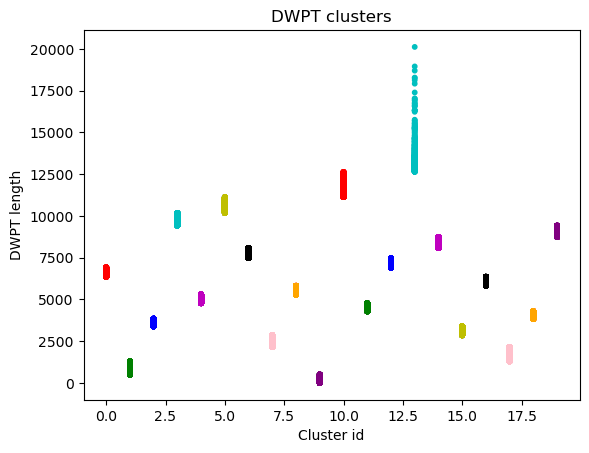

In [181]:
# K-means 聚类
def kmeans_clustering(data, K, max_iter=100):
    # 初始化聚类中心
    centers = []
    centers.append(np.random.choice(data))
    # centers.append(17500)
    for _ in range(K-1):
        distances = np.array([min([np.linalg.norm(x-c)**2 for c in centers]) for x in data])
        prob = distances / distances.sum()
        cumulative_prob = prob.cumsum()
        r = np.random.rand()
        for j, p in enumerate(cumulative_prob):
            if r < p:
                centers.append(data[j])
                break

    iIter = 0
    for _ in range(max_iter):
        # 计算每个样本与聚类中心的距离
        distances = np.abs(data[:, np.newaxis] - centers)
        # 将样本分配到最近的簇中
        labels = np.argmin(distances, axis=1)
        # 更新聚类中心
        new_centers = np.array([np.mean(data[labels == k]) if np.sum(labels == k) != 0 else centers[k] for k in range(K)])
        # 判断聚类中心是否变化
        if np.allclose(centers, new_centers):
            print("Iteration times = ", iIter)
            break
        centers = new_centers
        iIter += 1
    return labels, centers

def kmeans_plus_plus_clustering(X, n_clusters):
    X = np.array(X).reshape(-1, 1)
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++')
    kmeans.fit(X)
    labels = kmeans.labels_
    
    return labels

# 聚类
K = 20
# cluster_labels, cluster_centers = kmeans_clustering(np.array(dwpt_lists_flatten), K)
cluster_labels = kmeans_plus_plus_clustering(np.array(dwpt_lists_flatten), K)
np.save(os.path.join(dwpt_list_savepath, "cluster_labels.npy"), cluster_labels)

# # 打印聚类结果
for k in range(K):
    cluster_data = np.array(dwpt_lists_flatten)[cluster_labels == k]
    print(f"Cluster std {k+1}: {np.std(cluster_data)}")
for k in range(K):
    cluster_data = np.array(dwpt_lists_flatten)[cluster_labels == k]
    print(f"Cluster size {k+1}: {cluster_data.shape}")

# # 打印聚类中心
# print("Cluster centers:", cluster_centers)

# 可视化
selected_colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k', 'pink', 'orange', 'purple']
colors = [selected_colors[i%len(selected_colors)] for i in cluster_labels]
plt.figure()
plt.scatter(cluster_labels, dwpt_lists_flatten, c=colors, s=10, cmap='viridis')
plt.xlabel("Cluster id")
plt.ylabel("DWPT length")
plt.title("DWPT clusters")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.savefig(os.path.join(dwpt_list_savepath, "DWPT_clusters.png"), bbox_inches='tight')
plt.show()

In [182]:
# 重新组织文件结构并进行卡方检验
mat_label_lists = [[] for k in range(K)]
Chi_square_test_array = [[0, 0] for k in range(K)]

exception_mat_names = []
for folder_name in folder_names:
    data_folder = os.path.join(exception_data_readpath, folder_name)
    for mat_name in os.listdir(data_folder):
        exception_mat_names.append(mat_name)
# exception_positions = [np.where(np.array(download_folder_names) == mat_name)[0] for mat_name in np.array(exception_mat_names)]

for i, folder_name in enumerate(download_folder_names):
    data_folder = os.path.join(download_data_readpath, folder_name)
    mat_names = os.listdir(data_folder)
    for j, mat_name in enumerate(mat_names):
        mat_flatten_idx = sum(dwpt_len_list[:i]) + j
        cluster_idx = cluster_labels[mat_flatten_idx]
        mat_label_lists[cluster_idx].append([folder_name, mat_name])
        # print(mat_name, "is in cluster", cluster_idx)
        if mat_name in exception_mat_names:
            Chi_square_test_array[cluster_idx][0] += 1
            # print(mat_name, "is in exception list")
        Chi_square_test_array[cluster_idx][1] += 1

# 进行卡方检验
Chi_square_test_array = np.array(Chi_square_test_array)
chi2, p, dof, expected = chi2_contingency(Chi_square_test_array)

print("卡方值:", chi2)
print("p值:", p)
print("自由度:", dof)
# print("期望频数:", expected)

卡方值: 9557.066711979205
p值: 0.0
自由度: 19


In [178]:
print(Chi_square_test_array.T[0])
print(np.sum(Chi_square_test_array.T[1]))

[ 32  66  18  29  39   8  38  14  47  24  26  40  38   0  13 807  34  79
  41  38  61  21  10  19  40  39  33  22  43  44  39  82  23  34  38  14
   4  18   1  35  22  31  21   2  31  88  18  10  35  31  63  30  32  42
  28  33  34  14  32  28   0  29  38  23  36  32  63 901  35  39  16   0
  33  22  31]
180303


In [167]:
print(np.min(Chi_square_test_array[0]), np.max(Chi_square_test_array[0]), np.mean(Chi_square_test_array[0]))

121 12771 6446.0


In [2]:
# 抓取并整合所有出现Wind Shear Warning的数据
WSHR_savepath = os.path.join(result_savepath, "WSHR")
if not os.path.exists(WSHR_savepath):
    os.mkdir(WSHR_savepath)

selected_variable_list = ['ALT', 'AOAC', 'BAL1', 'CAS', 'PI', 'PTCH', 'ROLL', 'SAT', 'TH', 'WS']
'''
ALT: PRESSURE ALTITUDE
AOAC: CORRECTED ANGLE OF ATTACK
BAL1: BARO CORRECT ALTITUDE
CAS: COMPUTED AIRSPEED
PI: IMPACT PRESSURE
PICH: PITCH ANGLE
ROLL: ROLL ANGLE
SAT: STATIC AIR TEMPERATURE
TH: TRUE HEADING
WS: WIND SPEED
'''


WSHR_warning_dict = {}
for i, folder_name in enumerate(folder_names):
    print(f"Current Folder Name: {folder_name}")
    WSHR_warning_dict[folder_name] = {}
    data_folder = os.path.join(exception_data_readpath, folder_name)
    mat_names = os.listdir(data_folder)
    for j, mat_name in enumerate(mat_names):
        mat_path = os.path.join(data_folder, mat_name)
        mat_data = loadmat(mat_path)
        warn_positions = np.where(mat_data['WSHR'][0][0][0] == 0)[0]
        # warn_data = [[content[0][0][0][round((p+1)*content[0][0][1][0][0])-1] for variable, content in mat_data.items() if not variable.startswith('__')] for p in warn_positions]
        # warn_data = {variable: [content[0][0][0][round((p+1)*content[0][0][1][0][0])-1] for p in warn_positions] for variable, content in mat_data.items() if not variable.startswith('__')}
        warn_data = {variable: [content[0][0][0][round((p+1)*content[0][0][1][0][0])-1] for p in warn_positions] for variable, content in mat_data.items() if variable in selected_variable_list}

        WSHR_warning_dict[folder_name][mat_name] = {}
        WSHR_warning_dict[folder_name][mat_name]['warn_positions'] = warn_positions
        WSHR_warning_dict[folder_name][mat_name]['warn_data'] = warn_data

print('Collection finished')
np.save(os.path.join(WSHR_savepath, "WSHR_warning_dict_varAttached.npy"), WSHR_warning_dict)

Current Folder Name: Tail_652_1
Current Folder Name: Tail_652_2
Current Folder Name: Tail_652_3
Current Folder Name: Tail_652_4
Current Folder Name: Tail_652_5
Current Folder Name: Tail_652_6
Current Folder Name: Tail_652_7
Current Folder Name: Tail_652_8
Current Folder Name: Tail_653_1
Current Folder Name: Tail_653_2
Current Folder Name: Tail_653_3
Current Folder Name: Tail_653_4
Current Folder Name: Tail_653_5
Current Folder Name: Tail_653_6
Current Folder Name: Tail_653_7
Current Folder Name: Tail_653_8
Current Folder Name: Tail_654_1
Current Folder Name: Tail_654_2
Current Folder Name: Tail_654_3
Current Folder Name: Tail_654_4
Current Folder Name: Tail_654_5
Current Folder Name: Tail_654_6
Current Folder Name: Tail_654_7
Current Folder Name: Tail_654_8
Current Folder Name: Tail_655_1
Current Folder Name: Tail_655_2
Current Folder Name: Tail_655_3
Current Folder Name: Tail_655_4
Current Folder Name: Tail_655_5
Current Folder Name: Tail_655_6
Current Folder Name: Tail_655_7
Current 

In [21]:
for i, folder_name in enumerate(folder_names):
    data_folder = os.path.join(exception_data_readpath, folder_name)
    mat_names = os.listdir(data_folder)
    for j, mat_name in enumerate(mat_names):
        mat_path = os.path.join(data_folder, mat_name)
        mat_data = loadmat(mat_path)
        # print(np.where(mat_data['WSHR'][0][0][0]==0)[0])
        try:
            print([content[0][0][1][0][0] for variable, content in mat_data.items() if not variable.startswith('__')])
        except TypeError:
            print('haha')
        break
    break

[0.25, 0.25, 0.25, 0.25, 16, 16, 16, 4, 4, 4, 4, 4, 4, 16, 4, 4, 4, 4, 1, 4, 1, 1, 4, 4, 4, 8, 4, 1, 1, 1, 4, 4, 8, 4, 2, 4, 4, 8, 4, 4, 4, 4, 4, 1, 1, 4, 4, 8, 4, 2, 2, 4, 1, 1, 4, 2, 1, 1, 1, 1, 4, 1, 1, 2, 2, 4, 4, 4, 4, 1, 1, 1, 1, 4, 4, 4, 4, 2, 2, 2, 1, 1, 1, 1, 0.25, 0.25, 0.25, 0.25, 0.25, 1, 1, 1, 4, 4, 4, 2, 2, 4, 1, 1, 4, 4, 4, 4, 1, 1, 4, 4, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0.25, 0.25, 0.25, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0.25, 0.25, 0.25, 1, 1, 1, 1, 0.25, 0.25, 0.25, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0.25, 0.25, 0.25, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0.25, 0.25]


C:\Users\86108\AppData\Local\Temp\ipykernel_27952\1669727972.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


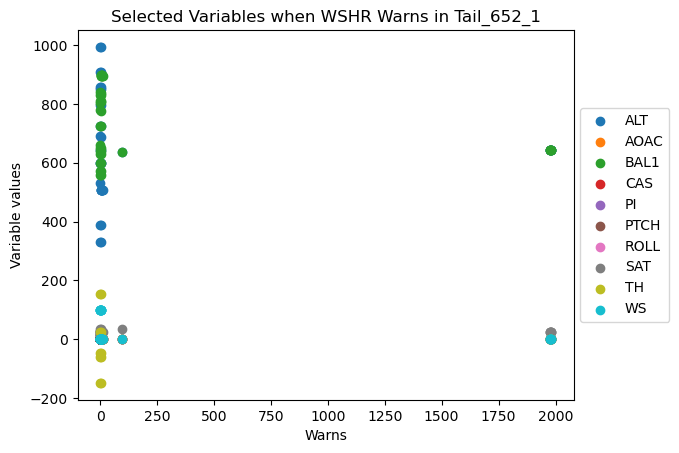

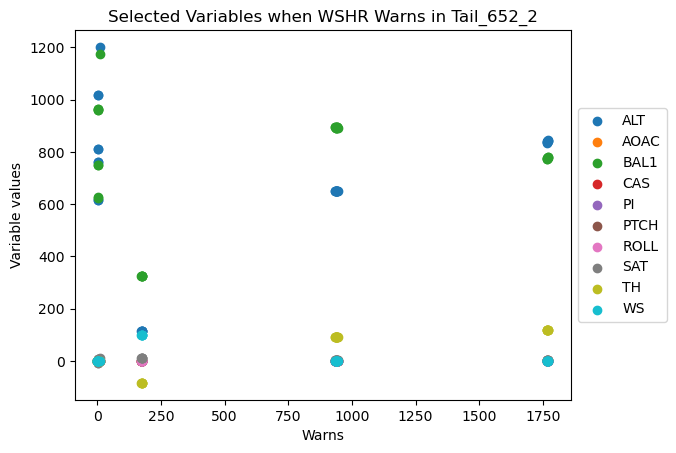

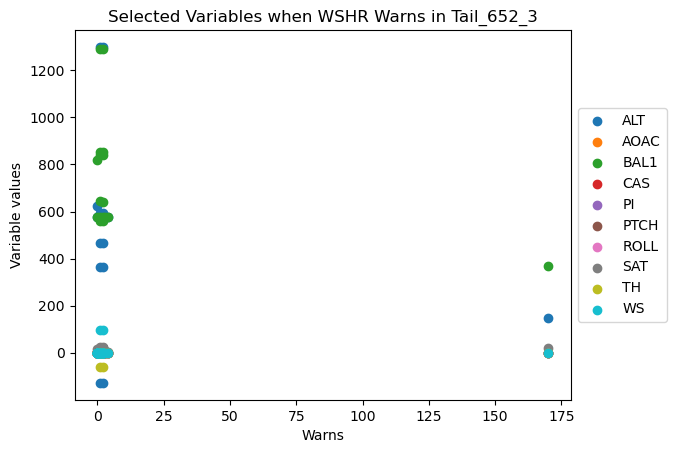

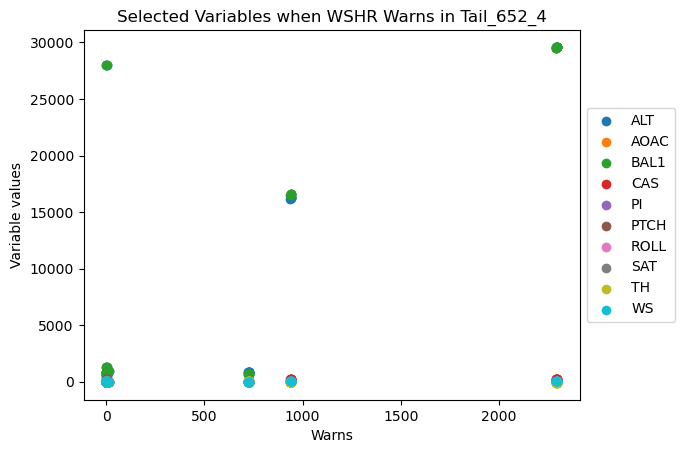

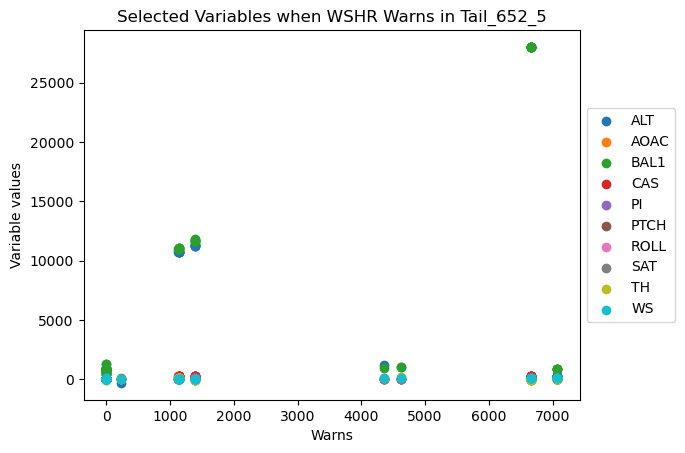

...

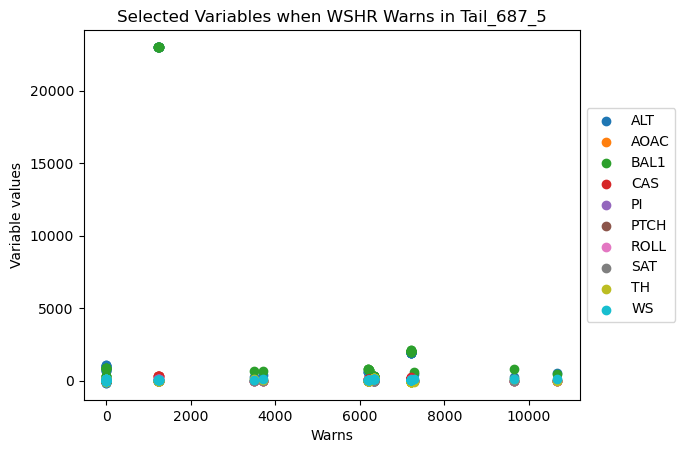

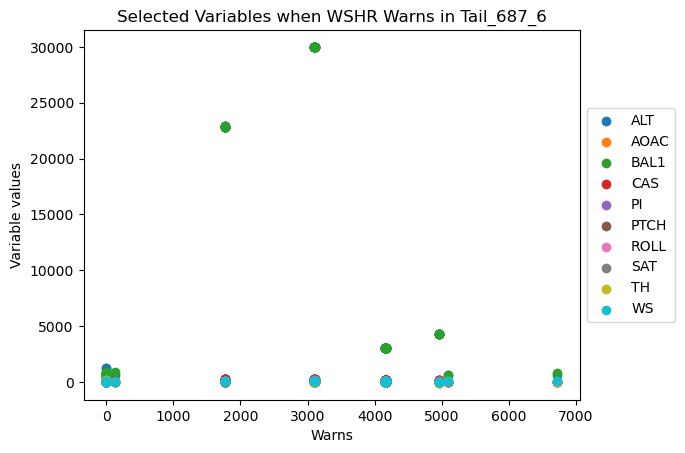

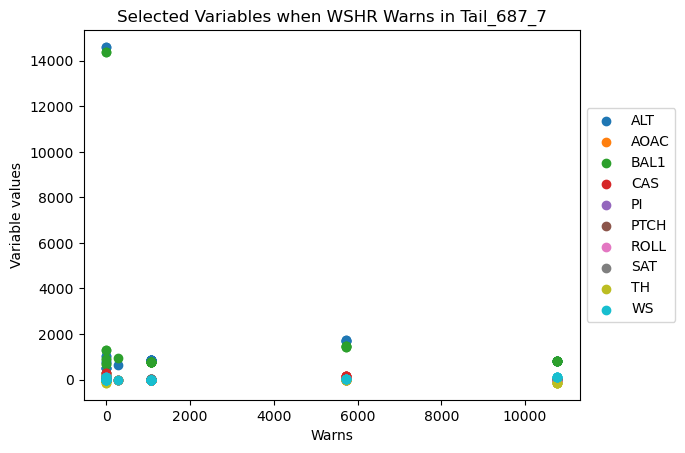

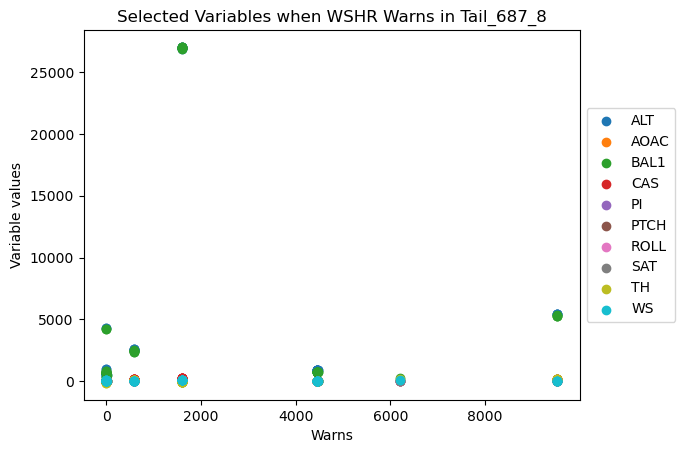

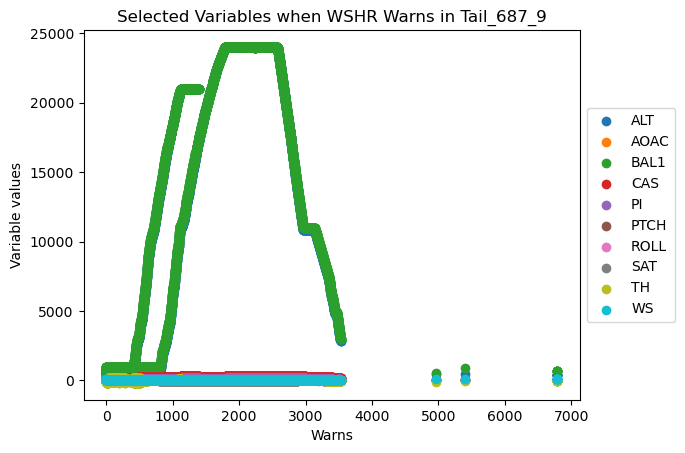

In [27]:
# 打印发生WSHR warning时的特定变量状态状态信息
# variable_WSHR_savepath = os.path.join(WSHR_savepath, "variable_WSHR_continuous")
variable_WSHR_savepath = os.path.join(WSHR_savepath, "variable_WSHR")
if not os.path.exists(variable_WSHR_savepath):
    os.mkdir(variable_WSHR_savepath)

for folder_name in folder_names:
    plt.figure()
    x_axis_warns = []
    iX = 1
    for mat_data in WSHR_warning_dict[folder_name].values():
        x_axis_warns.extend(mat_data['warn_positions'])
        # for i in range(len(mat_data['warn_positions'])):
        #     x_axis_warns.append(iX)
        #     iX += 1
    y_axis_value_lists = []
    for variable in selected_variable_list:
        y_axis_values = []
        for mat_data in WSHR_warning_dict[folder_name].values():
            y_axis_values.extend(mat_data['warn_data'][variable])
        # print(len(y_axis_values))
        y_axis_values = [item for sublist in y_axis_values for item in sublist]
        y_axis_value_lists.append(y_axis_values)
    for iVar in range(len(y_axis_value_lists)):
        plt.scatter(x_axis_warns, y_axis_value_lists[iVar], label=selected_variable_list[iVar])
    plt.xlabel('Warns')
    plt.ylabel('Variable values')
    plt.title('Selected Variables when WSHR Warns in '+folder_name)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.savefig(os.path.join(variable_WSHR_savepath, folder_name+'_selected_variables.png'), bbox_inches='tight')

    

In [15]:
tmp_list = WSHR_warning_dict['Tail_652_1']['652200102011019.mat']['warn_data']['ALT']
tmp_list = [item for sublist in tmp_list for item in sublist]
print(tmp_list)

[507, 507, 508, 507, 509, 507, 507, 508, 508]


In [18]:
# 对每个聚类计算WSHR的方差
cluster_savepath = os.path.join(result_savepath, "clusters")
WSHR_cluster_savepath = os.path.join(result_savepath, "WSHR_cluster")
if not os.path.exists(WSHR_cluster_savepath):
    os.mkdir(WSHR_cluster_savepath)

WSHR_exception_idx_lists = []
for k in range(K):
    cluster_k_savepath = os.path.join(cluster_savepath, f"cluster_{k+1}")
    mat_names = os.listdir(cluster_k_savepath)
    WSHR_exception_idx_list = []
    for mat_name in mat_names:
        mat_path = os.path.join(cluster_k_savepath, mat_name)
        mat_data = loadmat(mat_path)
        WSHR_data = mat_data["WSHR"][0][0][0]
        # print(np.array(WSHR_data).reshape(-1))
        WSHR_exception_idx = np.where(np.array(WSHR_data).reshape(-1)==0)
        # print(list(WSHR_exception_idx))
        WSHR_exception_idx_list.extend(list(WSHR_exception_idx)[0].tolist())
        # print(WSHR_exception_idx_list)
    WSHR_exception_idx_lists.append(WSHR_exception_idx_list)
    print(f"Cluster {k+1} std: {np.std(WSHR_exception_idx_list)}")
np.save(os.path.join(WSHR_cluster_savepath, f"WSHR_exception_idx_lists.npy"), WSHR_exception_idx_lists)

Cluster 1 std: 180.0843887878866
Cluster 2 std: 2279.8266456257247
Cluster 3 std: 672.957294708052
Cluster 4 std: 1262.0517918125045
Cluster 5 std: 1083.6993814863238
Cluster 6 std: 2162.4106748624445
Cluster 7 std: 1517.8288683291967
Cluster 8 std: 450.6138387666642
Cluster 9 std: 3207.2743269833354
Cluster 10 std: 39.6670762360168
Cluster 11 std: 1882.1608132522508
Cluster 12 std: 2075.354642871696
Cluster 13 std: 210.04124471565797
Cluster 14 std: 1285.7921167158931
Cluster 15 std: 944.591367211778
Cluster 16 std: 0.816496580927726


d:\coding\Anaconda\Software\lib\site-packages\numpy\lib\npyio.py:521: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


In [11]:
cluster_savepath = os.path.join(result_savepath, "clusters")
WSHR_cluster_savepath = os.path.join(result_savepath, "WSHR_cluster")
Chi_square_savepath = os.path.join(result_savepath, "Chi_square")

In [10]:
# 对各聚类文件夹中的WSHR异常值分布进行卡方检验
WSHR_exception_idx_lists = np.load(os.path.join(WSHR_cluster_savepath, f"WSHR_exception_idx_lists.npy"),
                                    allow_pickle=True)

# 获取所有聚类文件夹最大WSHR数据长度
WSHR_len_lists = []
mat_max_num_list = []
for k in range(K):
    WSHR_len_list = []
    cluster_k_savepath = os.path.join(cluster_savepath, f"cluster_{k+1}")
    mat_names = os.listdir(cluster_k_savepath)
    for mat_name in mat_names:
        mat_data = loadmat(os.path.join(cluster_k_savepath, mat_name))
        WSHR_len_list.append(len(mat_data['WSHR'][0][0][0]))
    WSHR_len_lists.append(WSHR_len_list)
    mat_max_num_list.append(np.max(WSHR_len_list))
np.save(os.path.join(WSHR_cluster_savepath, f"WSHR_len_lists.npy"), WSHR_len_lists)
np.save(os.path.join(WSHR_cluster_savepath, f"mat_max_num_list.npy"), mat_max_num_list)

Chi_square_test_lists = []
for k, idx_list in enumerate(WSHR_exception_idx_lists):
    Chi_square_test_list = [0 for i in range(len(internal_segment_quantiles)+1)]
    
    for i, idx in enumerate(idx_list):
        internal_idx = np.digitize(idx/mat_max_num_list[k], internal_segment_quantiles)
        Chi_square_test_list[internal_idx] += 1
    Chi_square_test_lists.append(Chi_square_test_list)
Chi_square_test_array = np.array(Chi_square_test_lists).T
print(Chi_square_test_array)
print(np.sum(np.sum(Chi_square_test_array, axis=1),axis=0))
np.save(os.path.join(Chi_square_savepath, 'cluster_data_test_array'), Chi_square_test_array)

# 执行卡方检验
chi2, p, dof, expected = chi2_contingency(Chi_square_test_array)

print("卡方值:", chi2)
print("p值:", p)
print("自由度:", dof)
# print("期望频数:", expected)

d:\coding\Anaconda\Software\lib\site-packages\numpy\lib\npyio.py:521: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = np.asanyarray(arr)


[[ 1826 31053  3103 23244 22501 30891 26737   850  9154  5582  6930 19606
   2965 25669 14859     3]
 [  401 11188  2410 12973 19437 21106 18887   147  7755   222  2888 13422
    338 19082 11410     0]
 [  111  3884  1802  5548 12107  7549  6790    83  6158    82    32  7205
    126 13065 10354     0]
 [   91  3108   100  1444  4751  6039  3249    31  4742    18    49  5959
     35  4963  3820     0]]
479934


NameError: name 'K_square_savepath' is not defined

In [26]:
print(WSHR_exception_idx_lists[15])

[0, 1, 2]


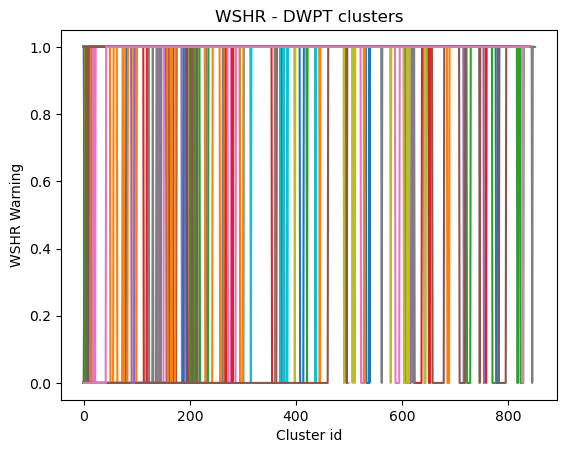

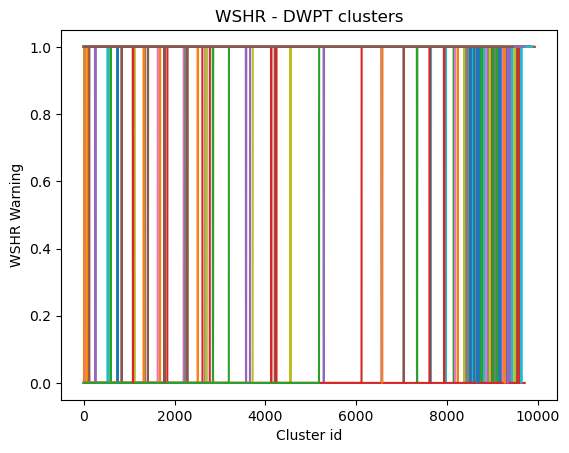

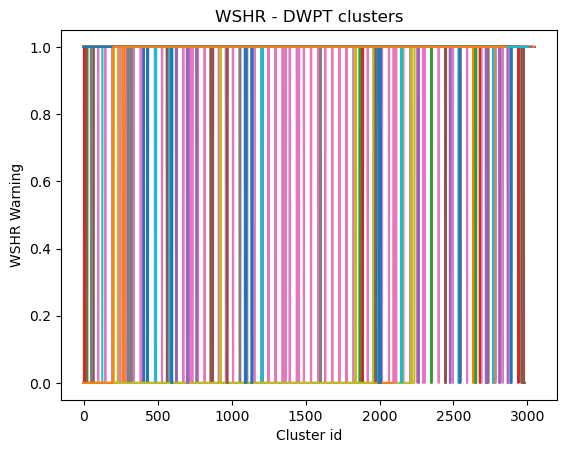

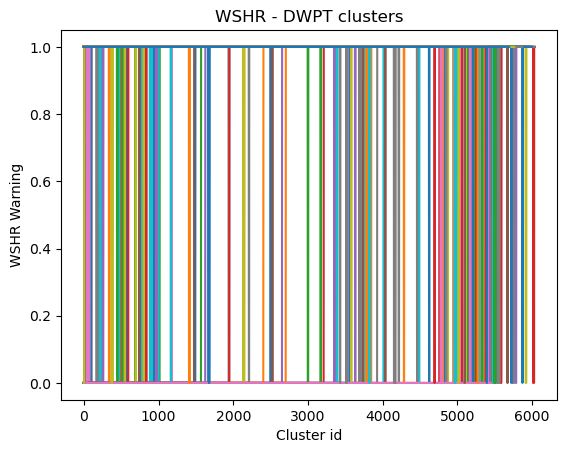

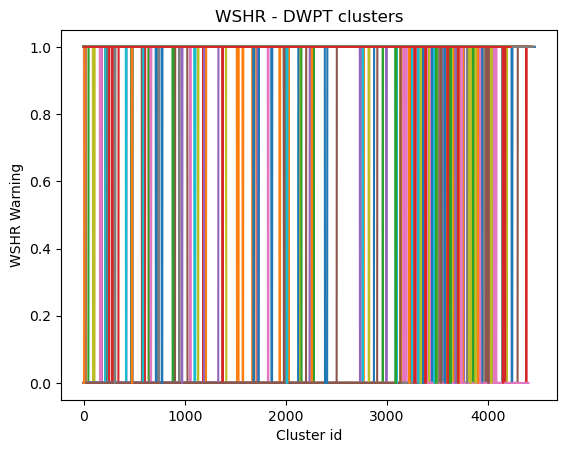

...

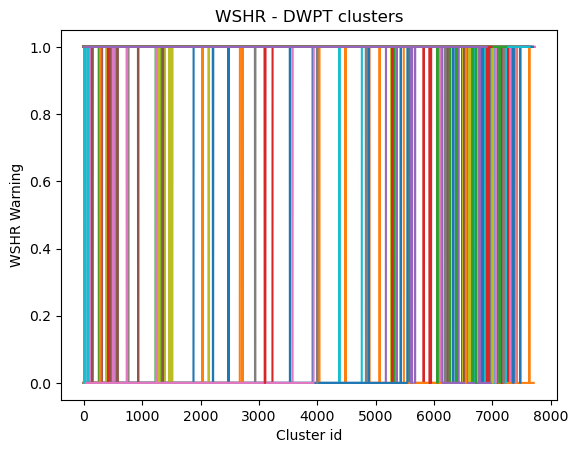

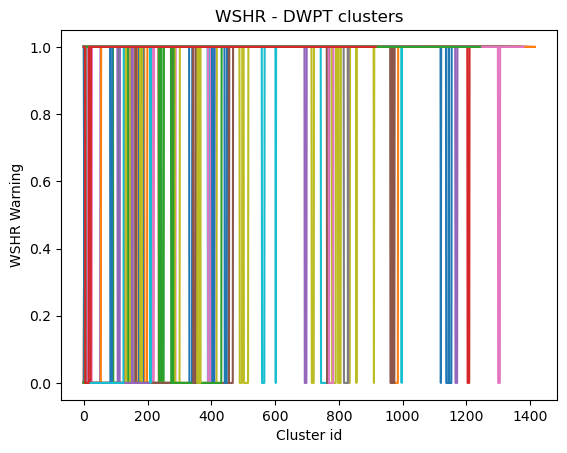

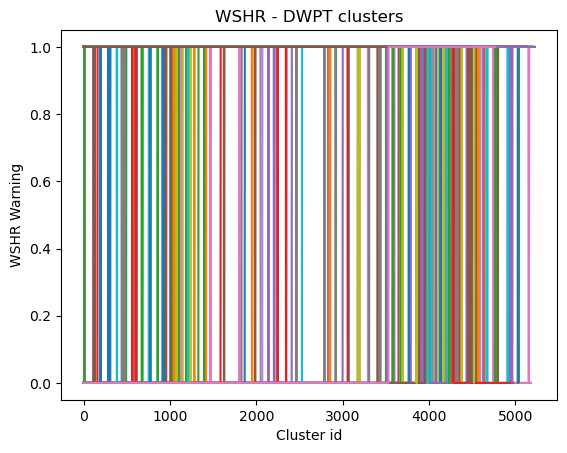

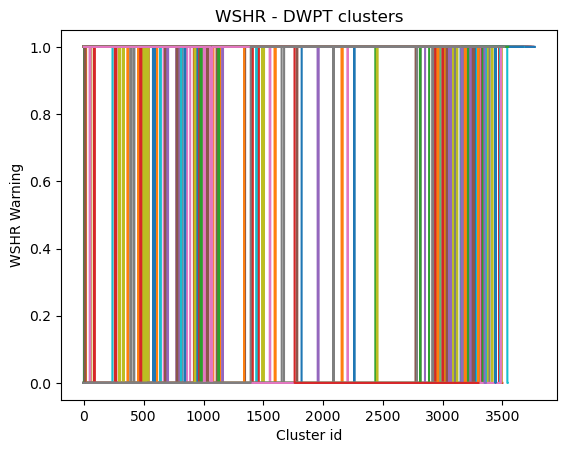

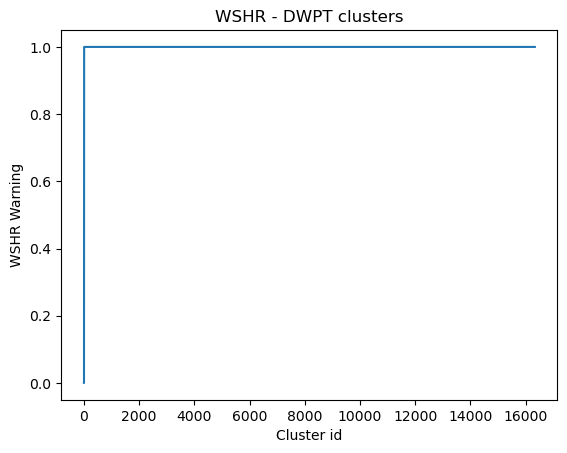

In [13]:
# 对每个聚类打印WSHR的折线图
cluster_savepath = os.path.join(result_savepath, "clusters")
WSHR_cluster_savepath = os.path.join(result_savepath, "WSHR_cluster")
if not os.path.exists(WSHR_cluster_savepath):
    os.mkdir(WSHR_cluster_savepath)

for k in range(K):
    cluster_k_savepath = os.path.join(cluster_savepath, f"cluster_{k+1}")
    mat_names = os.listdir(cluster_k_savepath)
    plt.figure()
    for mat_name in mat_names:
        mat_path = os.path.join(cluster_k_savepath, mat_name)
        mat_data = loadmat(mat_path)
        WSHR_data = mat_data["WSHR"][0][0][0]
        WSHR_data = np.array(WSHR_data).reshape(-1)
        # print(WSHR_data)
        plt.plot(WSHR_data)
    plt.xlabel("Cluster id")
    plt.ylabel("WSHR Warning")
    plt.title("WSHR - DWPT clusters")
    plt.savefig(os.path.join(WSHR_cluster_savepath, "WSHR_clusters_%d.png"%k))
    plt.show()

In [ ]:
# Greenwich时间可视化
K = 16
cluster_savepath = os.path.join(result_savepath, "clusters")
GMT_cluster_savepath = os.path.join(result_savepath, "GMT_cluster")
if not os.path.exists(GMT_cluster_savepath):
    os.mkdir(GMT_cluster_savepath)

for k in range(K):
    GMT_cluster_k_savepath = os.path.join(GMT_cluster_savepath, f"cluster_{k+1}")
    if not os.path.exists(GMT_cluster_k_savepath):
        os.mkdir(GMT_cluster_k_savepath)
    cluster_k_savepath = os.path.join(cluster_savepath, f"cluster_{k+1}")
    mat_names = os.listdir(cluster_k_savepath)
    for j, mat_name in enumerate(mat_names):
        plt.figure()
        mat_path = os.path.join(cluster_k_savepath, mat_name)
        mat_data = loadmat(mat_path)
        # print(mat_data.keys())
        GMT_HOUR_data = mat_data["GMT_HOUR"][0][0][0]
        GMT_MINUTE_data = mat_data["GMT_MINUTE"][0][0][0]
        GMT_SEC_data = mat_data["GMT_SEC"][0][0][0]
        plt.plot(GMT_HOUR_data)
        plt.plot(GMT_MINUTE_data)
        plt.plot(GMT_SEC_data)
        plt.xlabel("Cluster id")
        plt.ylabel("GMT data")
        plt.title("GMT - DWPT clusters")
        plt.savefig(os.path.join(GMT_cluster_k_savepath, "GMT_clusters_%d_%d.png"%(k,j)))
        # plt.show()